In [1]:
import geopandas as gpd
import momepy as mm

In [29]:
mastermap = gpd.read_parquet('../../urbangrammar_samba/OS_MasterMap_Buildings_sample/edinburgh.pq')
openmap = gpd.read_parquet('../../urbangrammar_samba/OS_MasterMap_Buildings_sample/edinburgh_om.pq')
mastermap_tess = gpd.read_parquet('../../urbangrammar_samba/OS_MasterMap_Buildings_sample/edinburgh_mm_tess.pq')
openmap_tess = gpd.read_parquet('../../urbangrammar_samba/OS_MasterMap_Buildings_sample/edinburgh_om_tess.pq')

## Get small sample of morphometric data

In [3]:
mastermap['area'] = mastermap.area
openmap['area'] = openmap.area

In [30]:
openmap_tess['area_t'] = openmap_tess.area
mastermap_tess['area_t'] = mastermap_tess.area

In [32]:
openmap_tess['peri_t'] = openmap_tess.length
mastermap_tess['peri_t'] = mastermap_tess.length

In [8]:
openmap_tess['eri'] = mm.EquivalentRectangularIndex(openmap_tess, 'area_t', 'peri_t').series

In [33]:
mastermap_tess['eri'] = mm.EquivalentRectangularIndex(mastermap_tess, 'area_t', 'peri_t').series

In [10]:
openmap_tess['car'] = mm.AreaRatio(openmap_tess, openmap, 'area_t', 'area', 'uID').series

In [34]:
mastermap_tess['car'] = mm.AreaRatio(mastermap_tess, mastermap, 'area_t', 'area', 'uID').series

In [35]:
mastermap_tess['xID'] = range(len(mastermap_tess))
openmap_tess['xID'] = range(len(openmap_tess))

In [36]:
openmap = openmap.merge(openmap_tess[['uID', 'xID']], on='uID', how='left')
mastermap = mastermap.merge(mastermap_tess[['uID', 'xID']], on='uID', how='left')

In [15]:
from libpysal.weights import Queen

In [16]:
om_w1 = Queen.from_dataframe(openmap_tess, idVariable='xID')

In [37]:
mm_w1 = Queen.from_dataframe(mastermap_tess, idVariable='xID')

/opt/conda/lib/python3.7/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 6 disconnected components.
 There are 5 islands with ids: 2497, 16639, 54931, 54961, 98954.
  warnings.warn(message)


In [18]:
om_w3 = mm.sw_high(k=3, weights=om_w1)

In [38]:
mm_w3 = mm.sw_high(k=3, weights=mm_w1)

In [21]:
openmap_tess.columns

Index(['uID', 'geometry', 'eID', 'area_t', 'peri_t', 'eri', 'car', 'xID'], dtype='object')

In [22]:
openmap_tess['area_t_IQR_3steps'] = mm.Range(openmap_tess, 'area_t', om_w3, 'xID', rng=(25, 75)).series

100%|██████████| 74736/74736 [00:46<00:00, 1594.96it/s]


In [23]:
openmap_tess['peri_t_IQR_3steps'] = mm.Range(openmap_tess, 'peri_t', om_w3, 'xID', rng=(25, 75)).series
openmap_tess['eri_IQR_3steps'] = mm.Range(openmap_tess, 'eri', om_w3, 'xID', rng=(25, 75)).series
openmap_tess['car_IQR_3steps'] = mm.Range(openmap_tess, 'car', om_w3, 'xID', rng=(25, 75)).series

100%|██████████| 74736/74736 [00:46<00:00, 1591.84it/s]


In [39]:
mastermap_tess['area_t_IQR_3steps'] = mm.Range(mastermap_tess, 'area_t', mm_w3, 'xID', rng=(25, 75)).series
mastermap_tess['peri_t_IQR_3steps'] = mm.Range(mastermap_tess, 'peri_t', mm_w3, 'xID', rng=(25, 75)).series
mastermap_tess['eri_IQR_3steps'] = mm.Range(mastermap_tess, 'eri', mm_w3, 'xID', rng=(25, 75)).series
mastermap_tess['car_IQR_3steps'] = mm.Range(mastermap_tess, 'car', mm_w3, 'xID', rng=(25, 75)).series

100%|██████████| 234373/234373 [02:26<00:00, 1599.36it/s]


In [40]:
openmap_tess = openmap_tess.merge(openmap[['uID', 'area']], on='uID', how='left')
mastermap_tess = mastermap_tess.merge(mastermap[['uID', 'area']], on='uID', how='left')

In [43]:
openmap_tess['area_IQR_3steps'] = mm.Range(openmap_tess, 'area', om_w3, 'xID', rng=(25, 75)).series

  2%|▏         | 1806/74884 [00:27<18:48, 64.78it/s]


KeyboardInterrupt: 

In [ ]:
mastermap_tess['area_IQR_3steps'] = mm.Range(mastermap_tess, 'area', mm_w3, 'xID', rng=(25, 75)).series

## Try k-means
### OpenMap

In [44]:
from sklearn import preprocessing
from sklearn.cluster import KMeans

In [45]:
scaler = preprocessing.StandardScaler()

In [47]:
cols = [col for col in openmap_tess.columns if 'IQR' in col]
cols

['area_t_IQR_3steps', 'peri_t_IQR_3steps', 'eri_IQR_3steps', 'car_IQR_3steps']

In [48]:
om_data = scaler.fit_transform(openmap_tess[cols].fillna(0))

In [49]:
kmeans = KMeans(n_clusters=5, random_state=0).fit(om_data)

In [55]:
openmap_tess['cluster'] = kmeans.labels_

In [56]:
openmap_tess['centroid'] = openmap_tess.centroid

<AxesSubplot:>

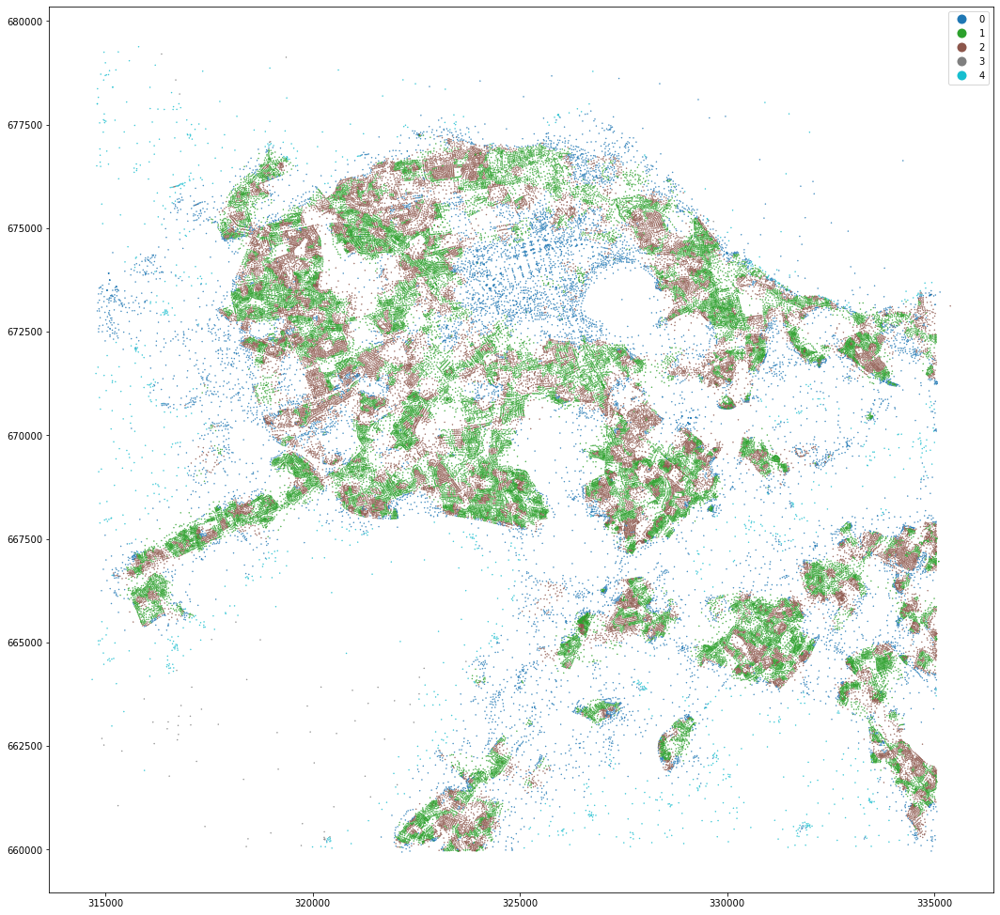

In [58]:
openmap_tess.set_geometry('centroid').plot('cluster', categorical=True, figsize=(18, 18), legend=True, markersize=.2)

<AxesSubplot:>

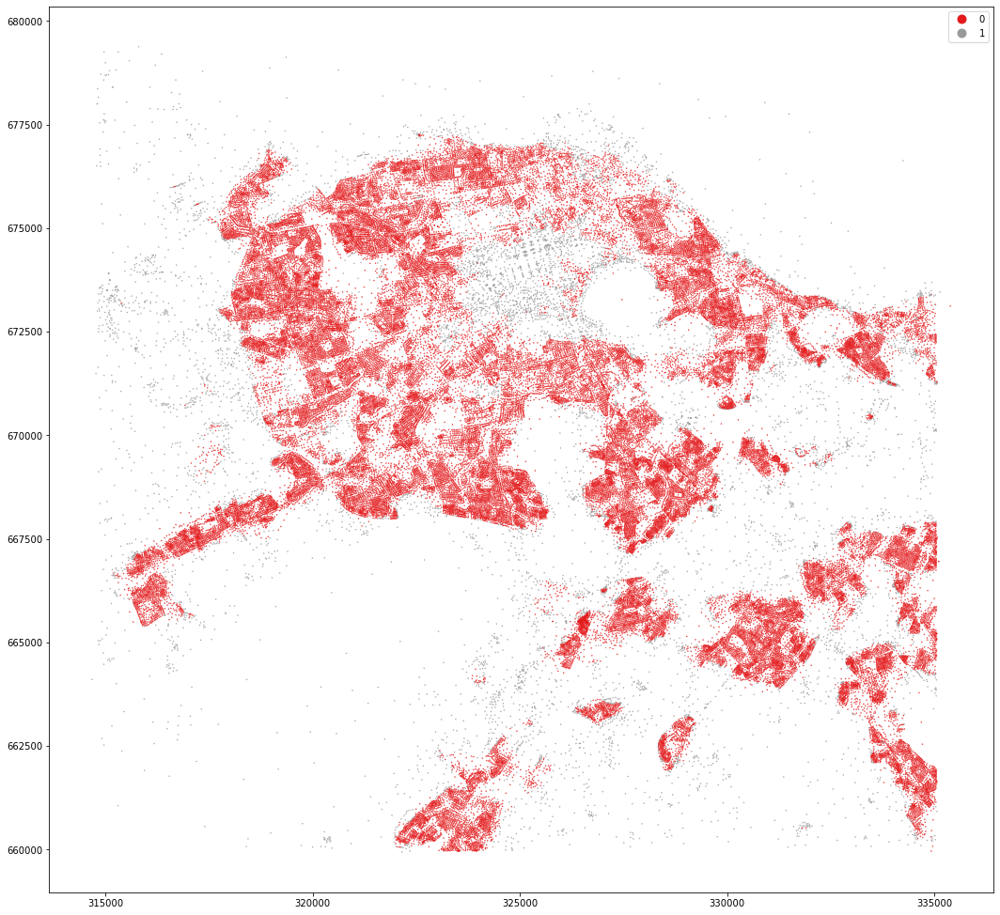

In [68]:
om_data = scaler.fit_transform(openmap_tess[cols].fillna(0))
kmeans = KMeans(n_clusters=2, random_state=0).fit(om_data)
openmap_tess['cluster2'] = kmeans.labels_
openmap_tess.set_geometry('centroid').plot('cluster2', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Set1')

<AxesSubplot:>

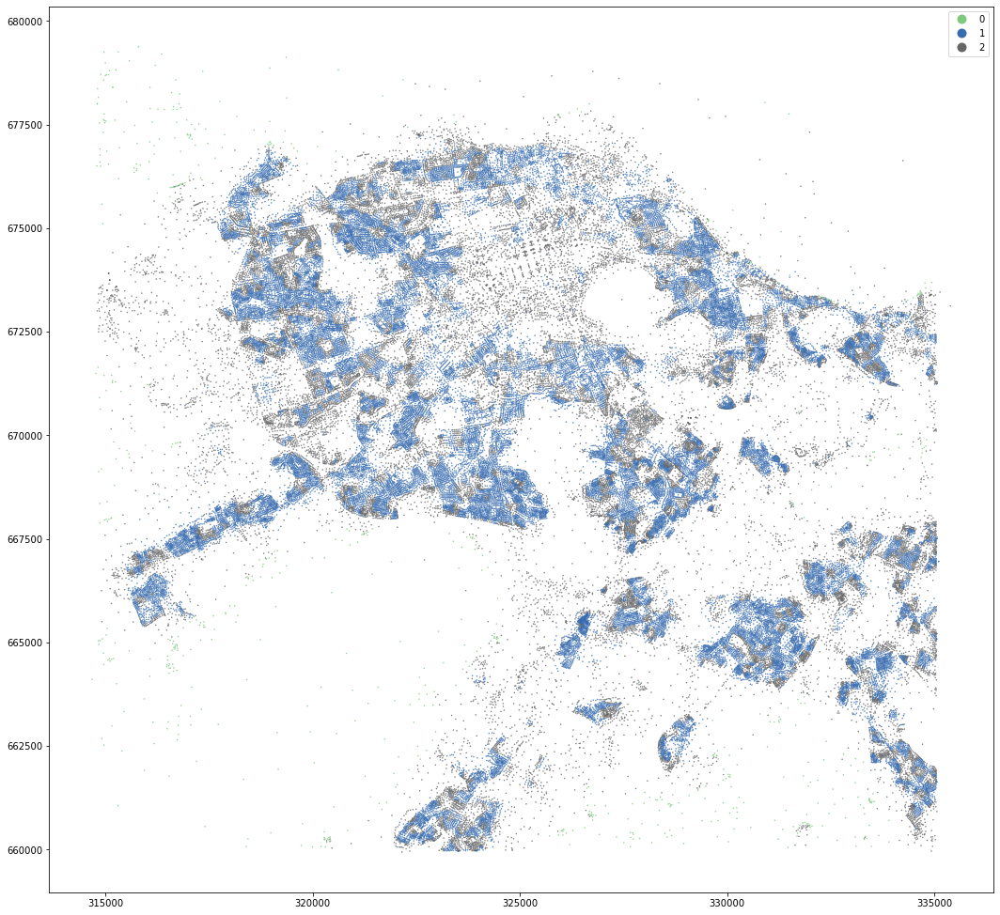

In [70]:
kmeans = KMeans(n_clusters=3, random_state=0).fit(om_data)
openmap_tess['cluster3'] = kmeans.labels_
openmap_tess.set_geometry('centroid').plot('cluster3', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Accent')

<AxesSubplot:>

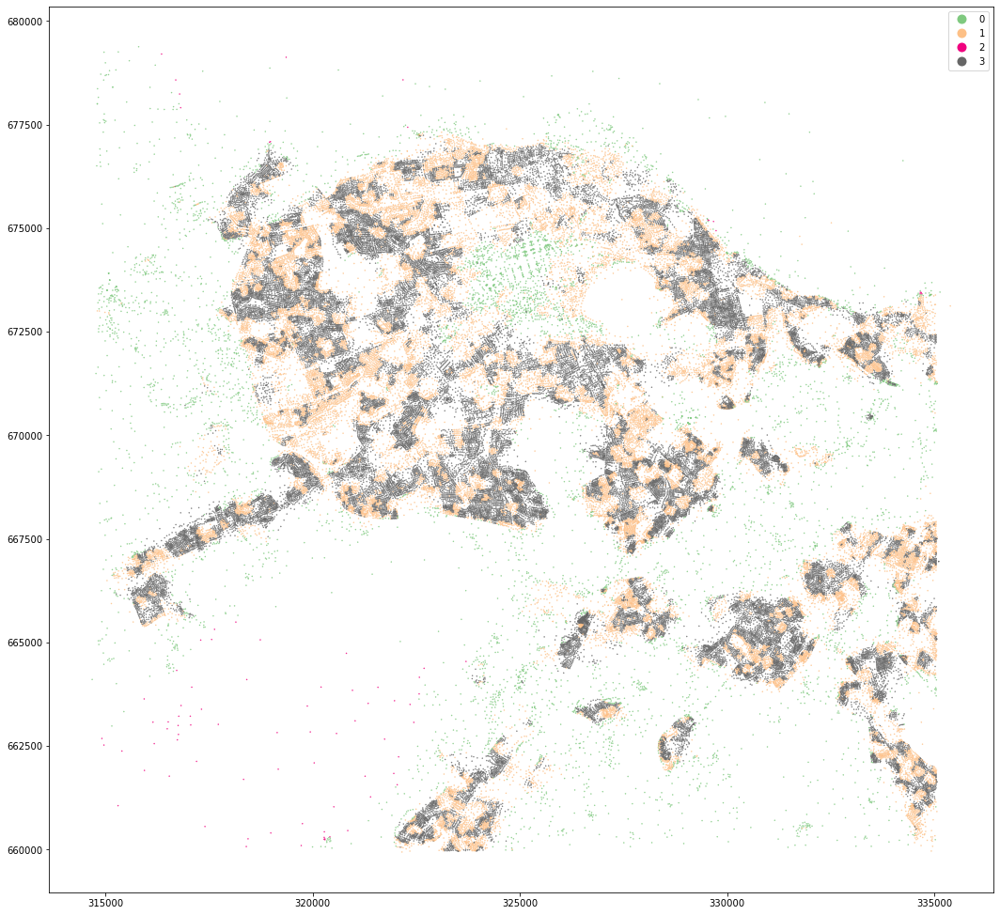

In [71]:
kmeans = KMeans(n_clusters=4, random_state=0).fit(om_data)
openmap_tess['cluster4'] = kmeans.labels_
openmap_tess.set_geometry('centroid').plot('cluster4', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Accent')

<AxesSubplot:>

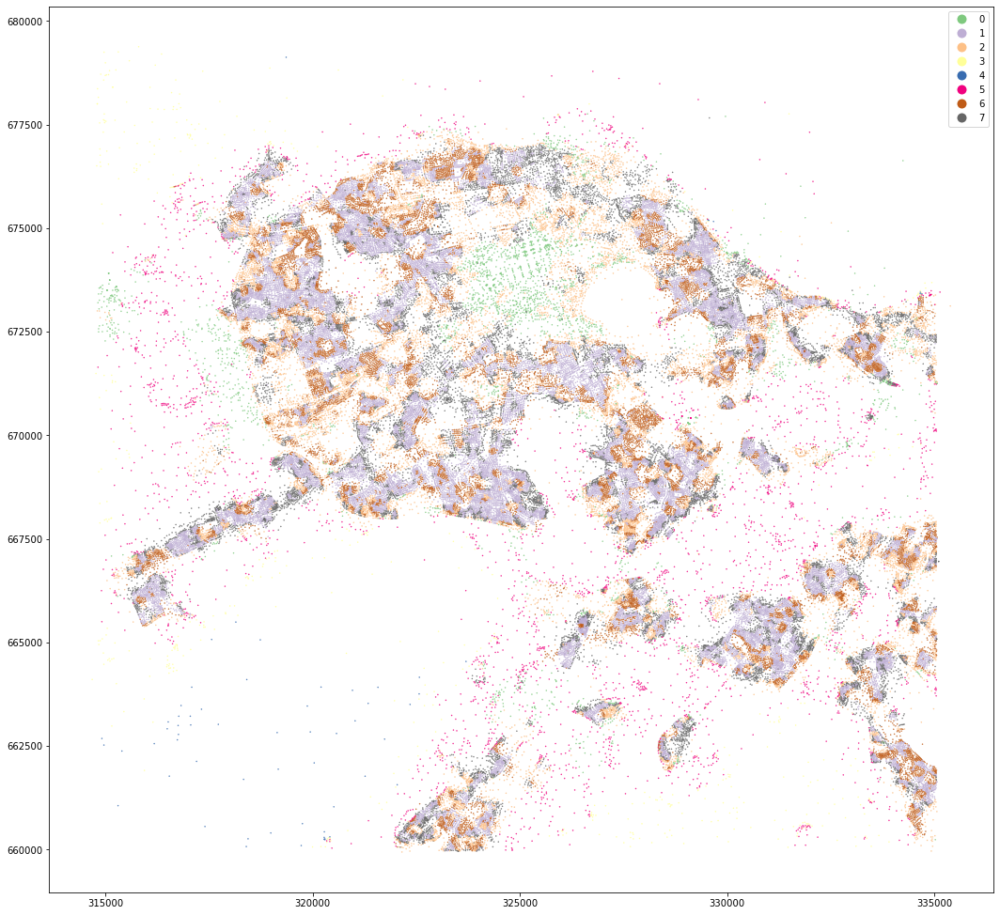

In [72]:
kmeans = KMeans(n_clusters=8, random_state=0).fit(om_data)
openmap_tess['cluster8'] = kmeans.labels_
openmap_tess.set_geometry('centroid').plot('cluster8', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Accent')

### MasterMap

In [59]:
om_data = scaler.fit_transform(mastermap_tess[cols].fillna(0))
kmeans = KMeans(n_clusters=5, random_state=0).fit(om_data)
mastermap_tess['cluster'] = kmeans.labels_

<AxesSubplot:>

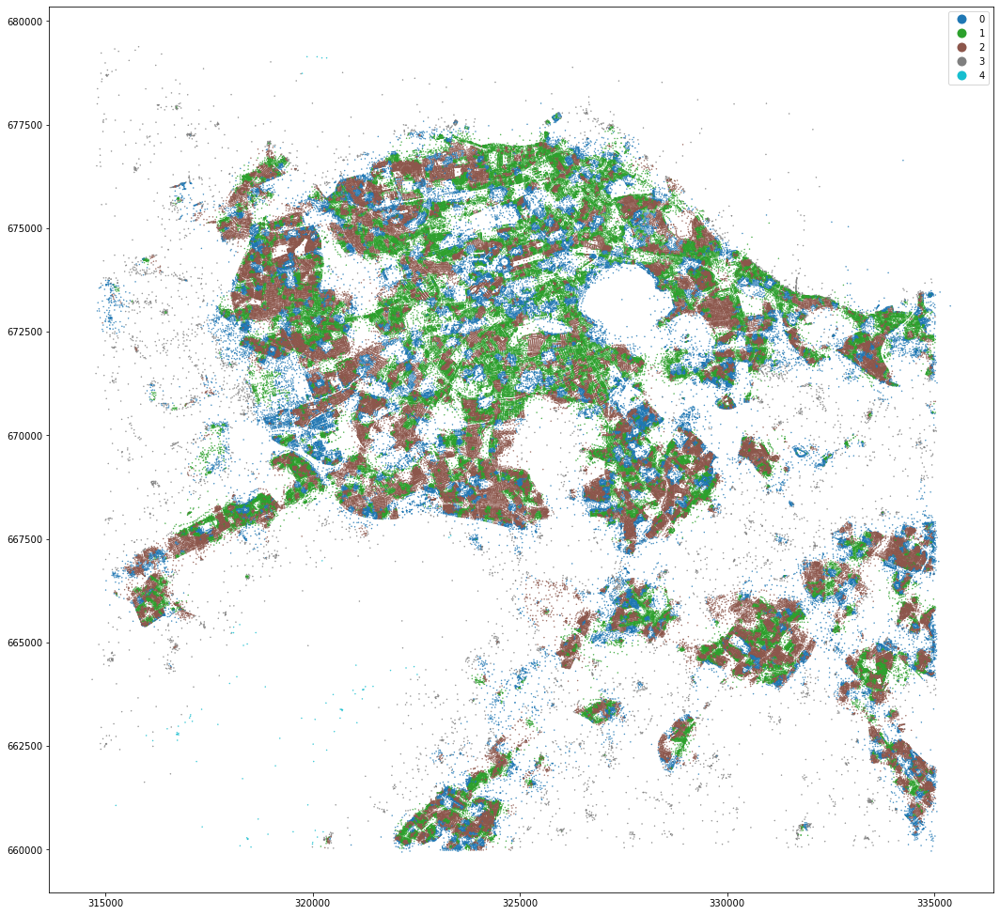

In [60]:
mastermap_tess['centroid'] = mastermap_tess.centroid
mastermap_tess.set_geometry('centroid').plot('cluster', categorical=True, figsize=(18, 18), legend=True, markersize=.2)

In [61]:
kmeans = KMeans(n_clusters=2, random_state=0).fit(om_data)
mastermap_tess['cluster2'] = kmeans.labels_

<AxesSubplot:>

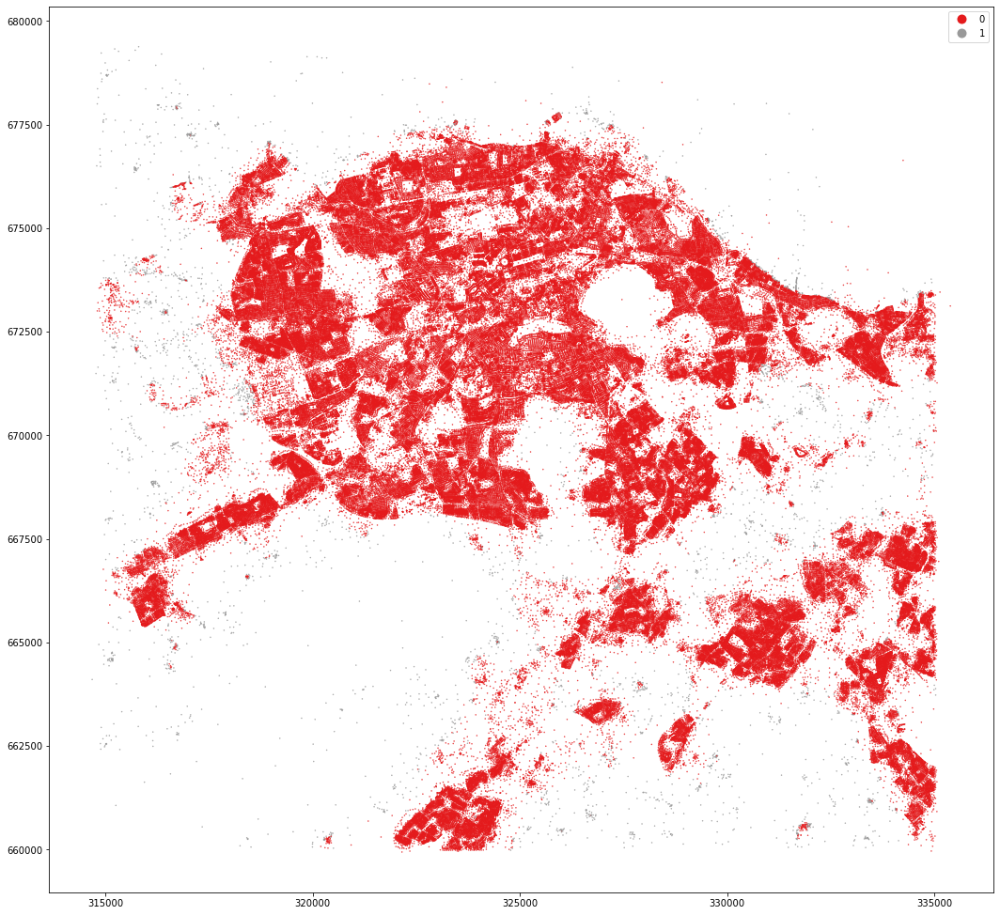

In [64]:
mastermap_tess.set_geometry('centroid').plot('cluster2', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Set1')

<AxesSubplot:>

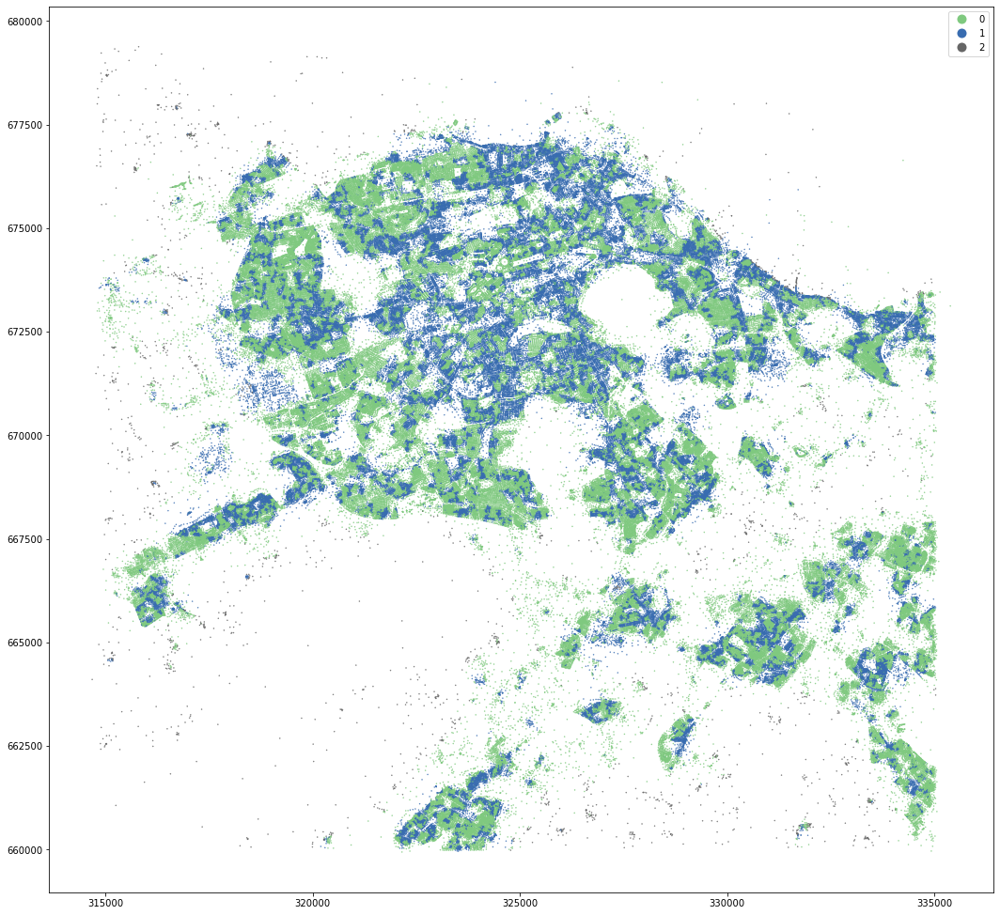

In [66]:
kmeans = KMeans(n_clusters=3, random_state=0).fit(om_data)
mastermap_tess['cluster3'] = kmeans.labels_
mastermap_tess.set_geometry('centroid').plot('cluster3', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Accent')

<AxesSubplot:>

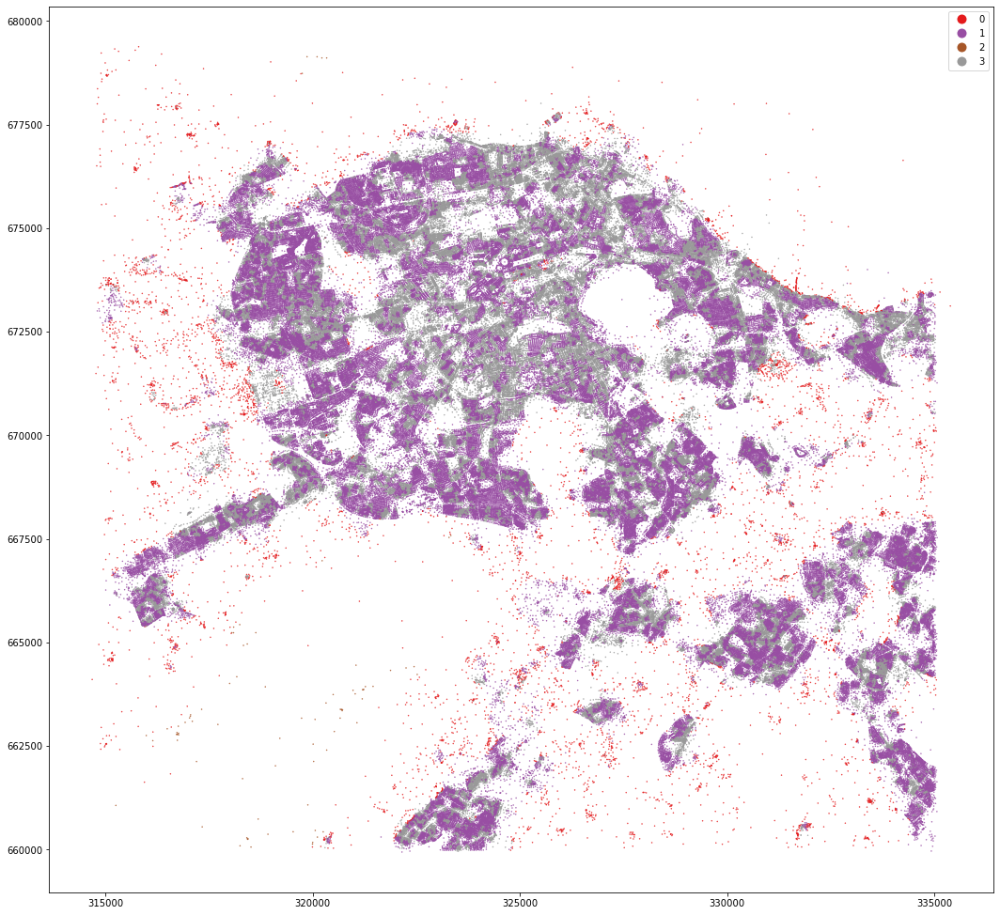

In [67]:
kmeans = KMeans(n_clusters=4, random_state=0).fit(om_data)
mastermap_tess['cluster4'] = kmeans.labels_
mastermap_tess.set_geometry('centroid').plot('cluster4', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Set1')

<AxesSubplot:>

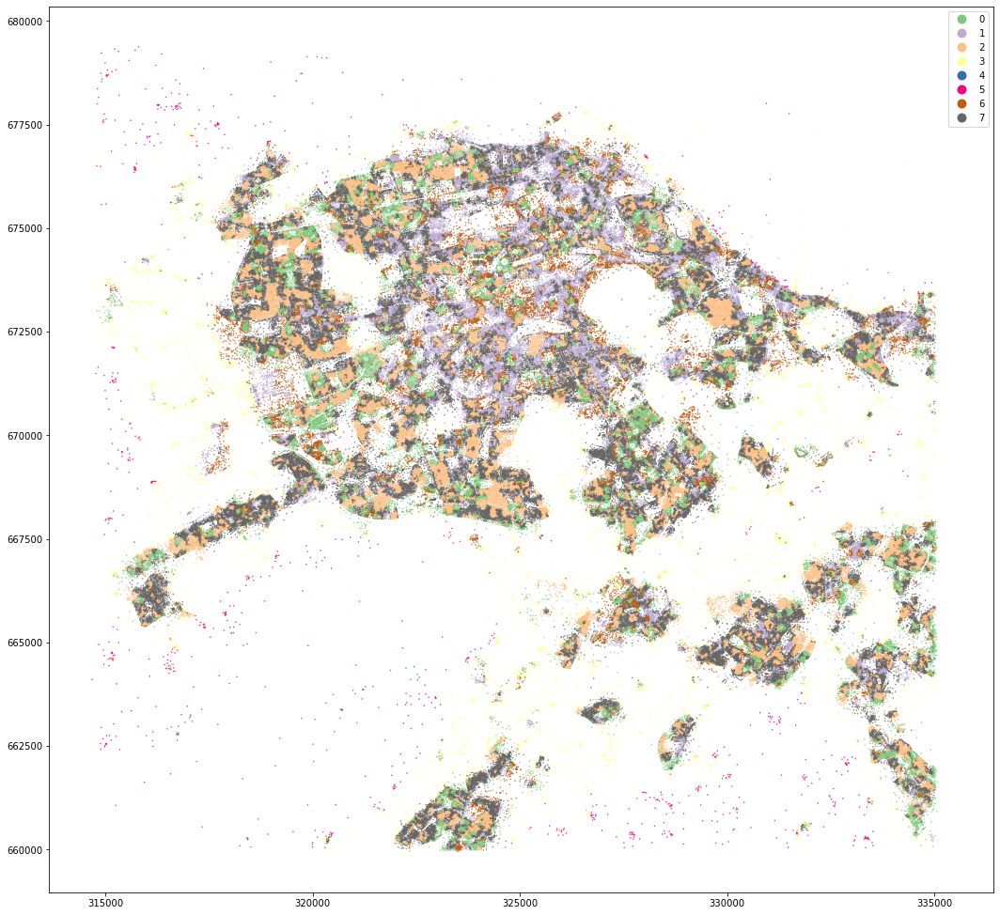

In [74]:
kmeans = KMeans(n_clusters=8, random_state=0).fit(om_data)
mastermap_tess['cluster8'] = kmeans.labels_
mastermap_tess.set_geometry('centroid').plot('cluster8', categorical=True, figsize=(18, 18), legend=True, markersize=.2, cmap='Accent')

In [75]:
mastermap_tess.to_parquet('../../urbangrammar_samba/OS_MasterMap_Buildings_sample/edinburgh_mm_tess_clus.pq')
openmap_tess.to_parquet('../../urbangrammar_samba/OS_MasterMap_Buildings_sample/edinburgh_om_tess_clus.pq')

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: this is an initial implementation of Parquet/Feather file support and associated metadata.  This is tracking version 0.1.0 of the metadata specification at https://github.com/geopandas/geo-arrow-spec

This metadata specification does not yet make stability promises.  We do not yet recommend using this in a production setting unless you are able to rewrite your Parquet/Feather files.

To further ignore this warning, you can do: 
import warnings; warnings.filterwarnings('ignore', message='.*initial implementation of Parquet.*')
  """Entry point for launching an IPython kernel.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: this is an initial implementation of Parquet/Feather file support and associated metadata.  This is tracking version 0.1.0 of the metadata specification at https://github.com/geopandas/geo-arrow-spec

This metadata specification does not yet make stability promise